<a href="https://colab.research.google.com/github/S-F110/YOLOv5-Object_Detection/blob/main/Project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Using YOLOv5 for Object Detection

This tutorial is based on the [YOLOv5 repository](https://github.com/ultralytics/yolov5) by [Ultralytics](https://www.ultralytics.com/). 




#Installing Dependencies

_(Remember to choose GPU in Runtime if not already selected. Runtime --> Change Runtime Type --> Hardware accelerator --> GPU)_

In [ ]:
# clone YOLOv5 repository

!git clone https://github.com/ultralytics/yolov5.git  # clone repository
%cd yolov5
!git reset --hard 886f1c03d839575afecb059accf74296fad395b6

Cloning into 'yolov5'...
remote: Enumerating objects: 10239, done.
remote: Total 10239 (delta 0), reused 0 (delta 0), pack-reused 10239
Receiving objects: 100% (10239/10239), 10.55 MiB | 17.20 MiB/s, done.
Resolving deltas: 100% (7071/7071), done.
/content/yolov5
HEAD is now at 886f1c0 DDP after autoanchor reorder (#2421)


In [ ]:

# clear_output()# install dependencies as necessary
!pip install -qr requirements.txt  # install dependencies (ignore errors)
import torch

from IPython.display import Image, clear_output  # to display images
from utils.google_utils import gdrive_download  # to download models/datasets

print('Setup complete. Using torch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

Setup complete. Using torch 1.10.0+cu111 _CudaDeviceProperties(name='Tesla K80', major=3, minor=7, total_memory=11441MB, multi_processor_count=13)


# Uploading the dataset from Roboflow


In [ ]:
# Install Roboflow
!pip install -q roboflow
from roboflow import Roboflow
rf = Roboflow(model_format="yolov5", notebook="roboflow-yolov5")


ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
google-colab 1.0.0 requires requests~=2.23.0, but you have requests 2.26.0 which is incompatible.
datascience 0.10.6 requires folium==0.2.1, but you have folium 0.8.3 which is incompatible.
albumentations 0.1.12 requires imgaug<0.2.7,>=0.2.5, but you have imgaug 0.2.9 which is incompatible.
upload and label your dataset, and get an API KEY here: https://app.roboflow.com/?model=yolov5&ref=roboflow-yolov5


In [ ]:
# Upload dataset folder (animal-dataset) from Roboflow
%cd /content/yolov5/

#after following the link above, recieve python code with these fields filled in
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="WAa5RDlAsJUHcQczYwk0")
project = rf.workspace().project("animal-dataset-auky1")
dataset = project.version(1).download("yolov5")

/content/yolov5
loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to Animal-dataset-1 in yolov5pytorch:: 100%|██████████| 1012/1012 [00:01<00:00, 894.21it/s]


# Define Model Configuration and Architecture

We will write a yaml script that defines the parameters for our model like the number of classes, anchors, and each layer.

You do not need to edit these cells, but you may.

In [ ]:
###  Configuration file 1 ###

%cat /content/yolov5/Animal-dataset-1/data.yaml


names:
- Butterfly
- Deer
- Goldfish
- Goose
- Horse
nc: 5
train: Animal-dataset-1/train/images
val: Animal-dataset-1/valid/images


In [ ]:
# define number of classes based on YAML
import yaml
with open( "/content/yolov5/Animal-dataset-1/data.yaml", 'r') as stream:
    num_classes = str(yaml.safe_load(stream)['nc'])
print (num_classes)

5


In [ ]:
 ###  Configuration file 2 ###

%cat /content/yolov5/models/yolov5l.yaml



# YOLOv5 🚀 by Ultralytics, GPL-3.0 license

# Parameters
nc: 5  # number of classes
depth_multiple: 1.0  # model depth multiple
width_multiple: 1.0  # layer channel multiple
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Conv, [64, 6, 2, 2]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 6, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 3, C3, [1024]],
   [-1, 1, SPPF, [1024, 5]],  # 9
  ]

# YOLOv5 v6.0 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  

# Training Custom YOLOv5 Detector




In [ ]:
# update your local repository
!git fetch --all
!git reset --hard origin/master
!git pull origin master


Fetching origin
HEAD is now at abbdd48 train -> val comment fix (#6024)
From https://github.com/ultralytics/yolov5
 * branch            master     -> FETCH_HEAD
Already up to date.


In [ ]:
# Weights & Biases  (optional)
%pip install -q wandb
import wandb
!wandb login

wandb: You can find your API key in your browser here: https://wandb.ai/authorize
wandb: Paste an API key from your profile and hit enter, or press ctrl+c to quit: 
wandb: ERROR API key must be 40 characters long, yours was 42
wandb: You can find your API key in your browser here: https://wandb.ai/authorize
wandb: Paste an API key from your profile and hit enter, or press ctrl+c to quit: 
wandb: ERROR API key must be 40 characters long, yours was 42
wandb: You can find your API key in your browser here: https://wandb.ai/authorize
wandb: Paste an API key from your profile and hit enter, or press ctrl+c to quit: 
wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


In [ ]:
# train.py is python train command we will use
# train yolov5s on COCO128 for 5 epochs   (higher epochs are used for large datasets) --weights yolov5s.pt --cfg '/content/yolov5/models/yolov5l.yaml'


In [ ]:
# time its performance 
%%time
%cd /content/yolov5/
!python train.py --img 416 --batch 16 --epochs 300 --data '/content/yolov5/Animal-dataset-1/data.yaml'  --weights  yolov5l.pt --name yolov5l_results  --cache --device 0


/content/yolov5
wandb: Currently logged in as: sf- (use `wandb login --relogin` to force relogin)
train: weights=yolov5l.pt, cfg=, data=/content/yolov5/Animal-dataset-1/data.yaml, hyp=data/hyps/hyp.scratch.yaml, epochs=300, batch_size=16, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, evolve=None, bucket=, cache=ram, image_weights=False, device=0, multi_scale=False, single_cls=False, adam=False, sync_bn=False, workers=8, project=runs/train, name=yolov5l_results, exist_ok=False, quad=False, linear_lr=False, label_smoothing=0.0, patience=100, freeze=0, save_period=-1, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v6.0-151-gabbdd48 torch 1.10.0+cu111 CUDA:0 (Tesla K80, 11441MiB)

hyperparameters: lr0=0.01, lrf=0.1, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1

### Visualizing Our Training Data 


GROUND TRUTH TRAINING DATA:


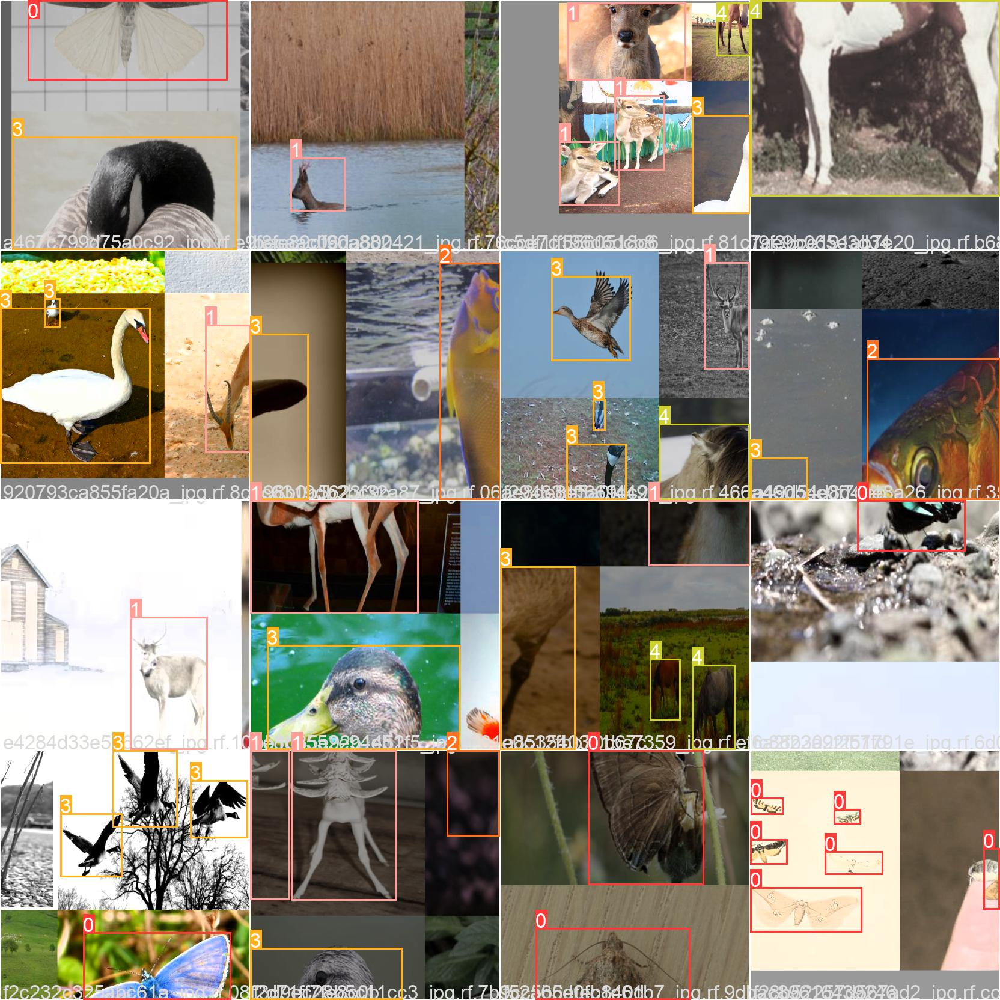

In [ ]:
# first, display our ground truth data
print("GROUND TRUTH TRAINING DATA:")
Image(filename='/content/yolov5/runs/train/yolov5l_results/train_batch0.jpg', width=900)

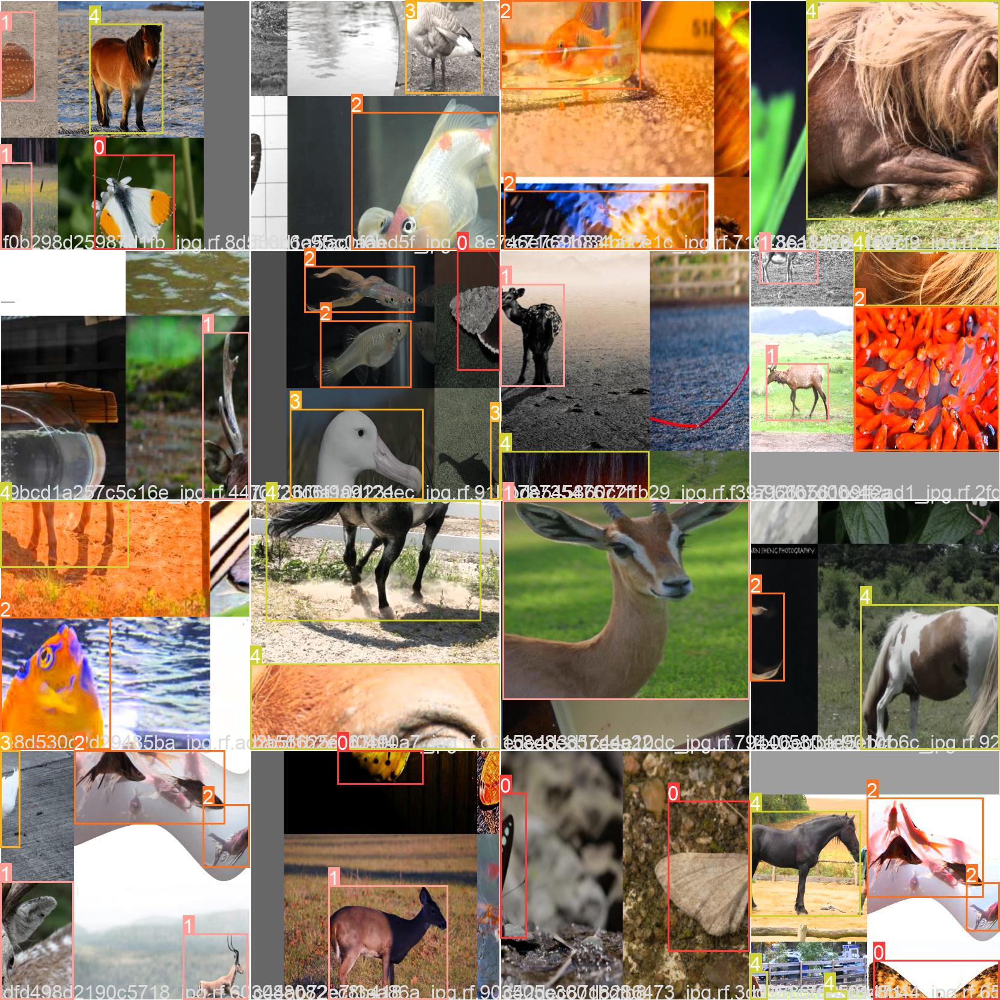

In [ ]:
Image(filename='/content/yolov5/runs/train/yolov5l_results/train_batch1.jpg', width=900)

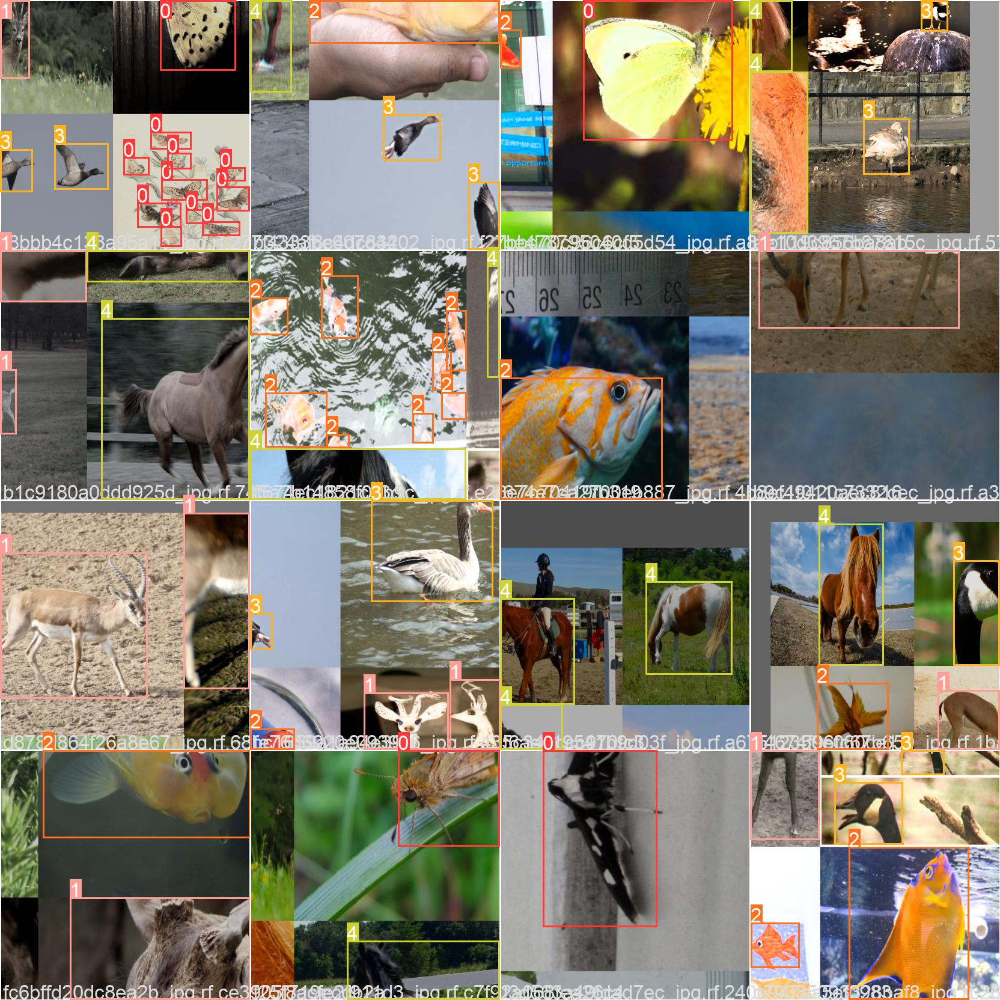

In [ ]:
Image(filename='/content/yolov5/runs/train/yolov5l_results/train_batch2.jpg', width=900)

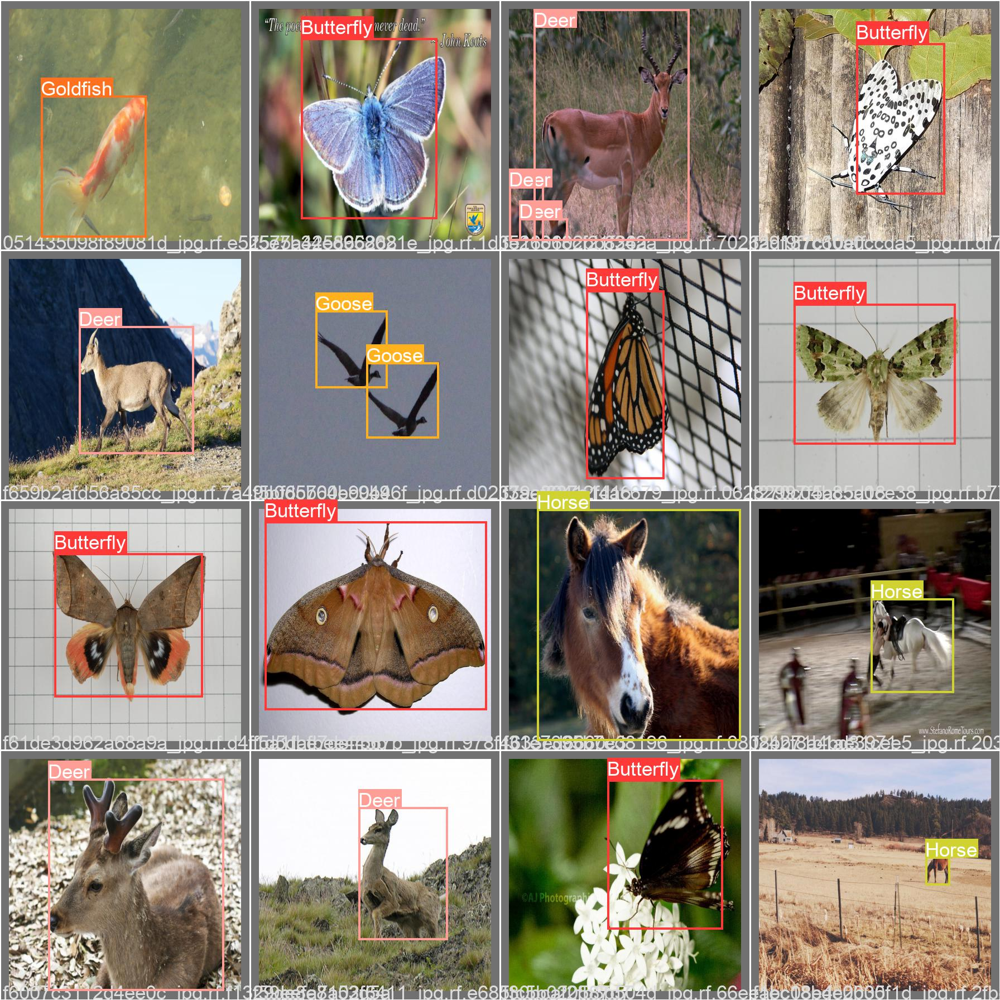

In [ ]:
Image(filename='/content/yolov5/runs/train/yolov5l_results/val_batch0_labels.jpg', width=900)

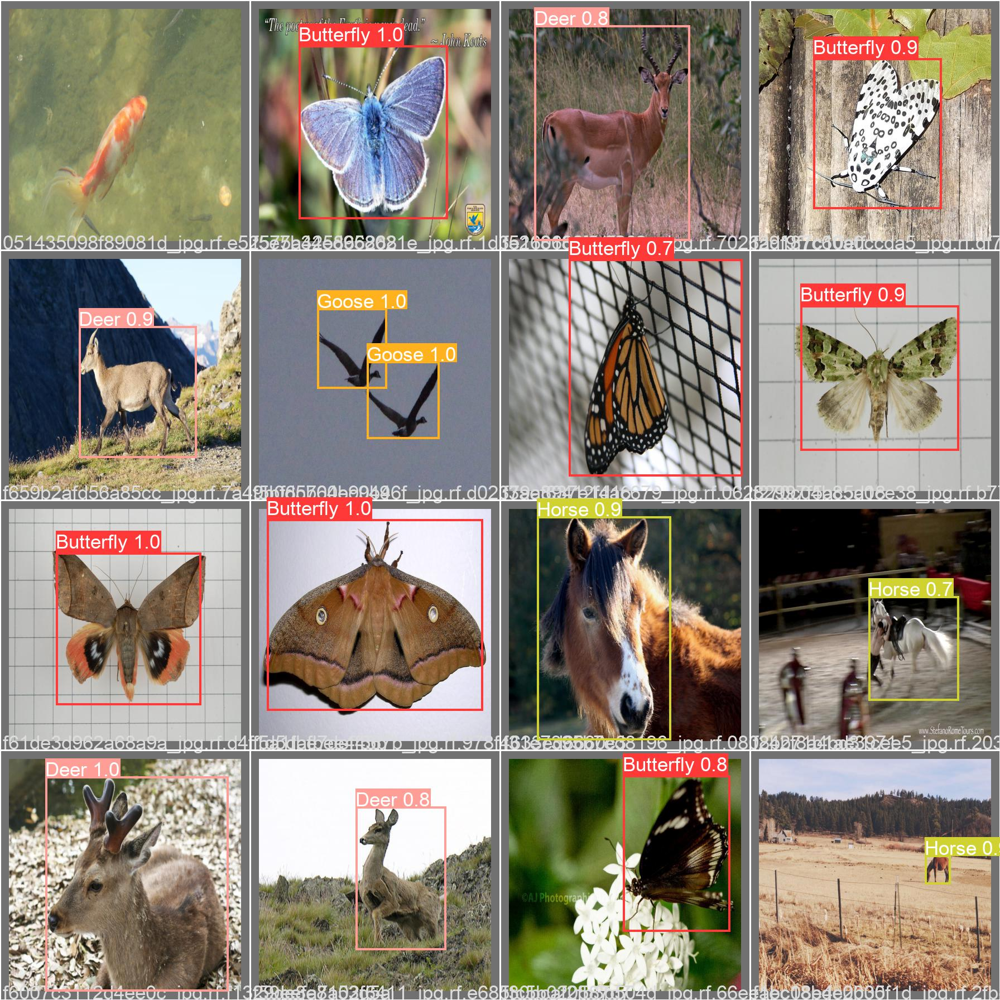

In [ ]:
Image(filename='/content/yolov5/runs/train/yolov5l_results/val_batch0_pred.jpg', width=900)

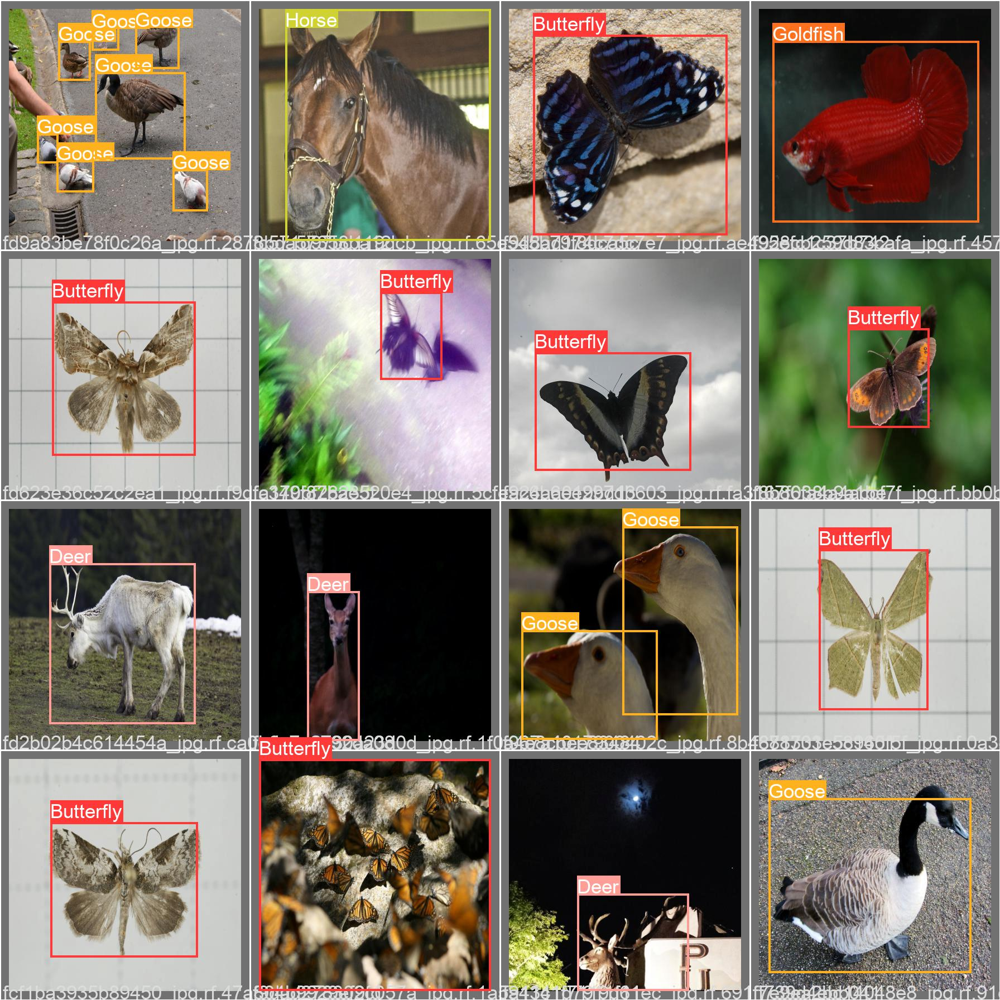

In [ ]:
Image(filename='/content/yolov5/runs/train/yolov5l_results/val_batch1_labels.jpg', width=900)

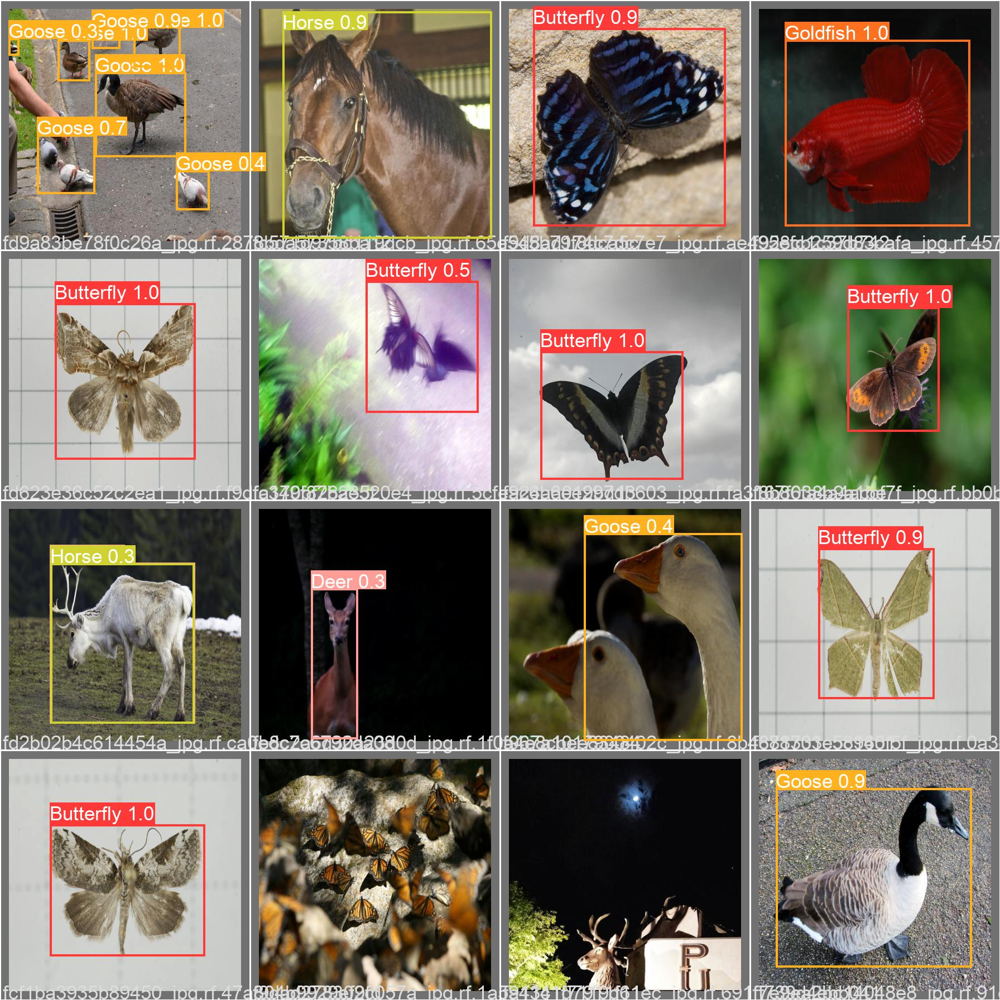

In [ ]:
Image(filename='/content/yolov5/runs/train/yolov5l_results/val_batch1_pred.jpg', width=900)

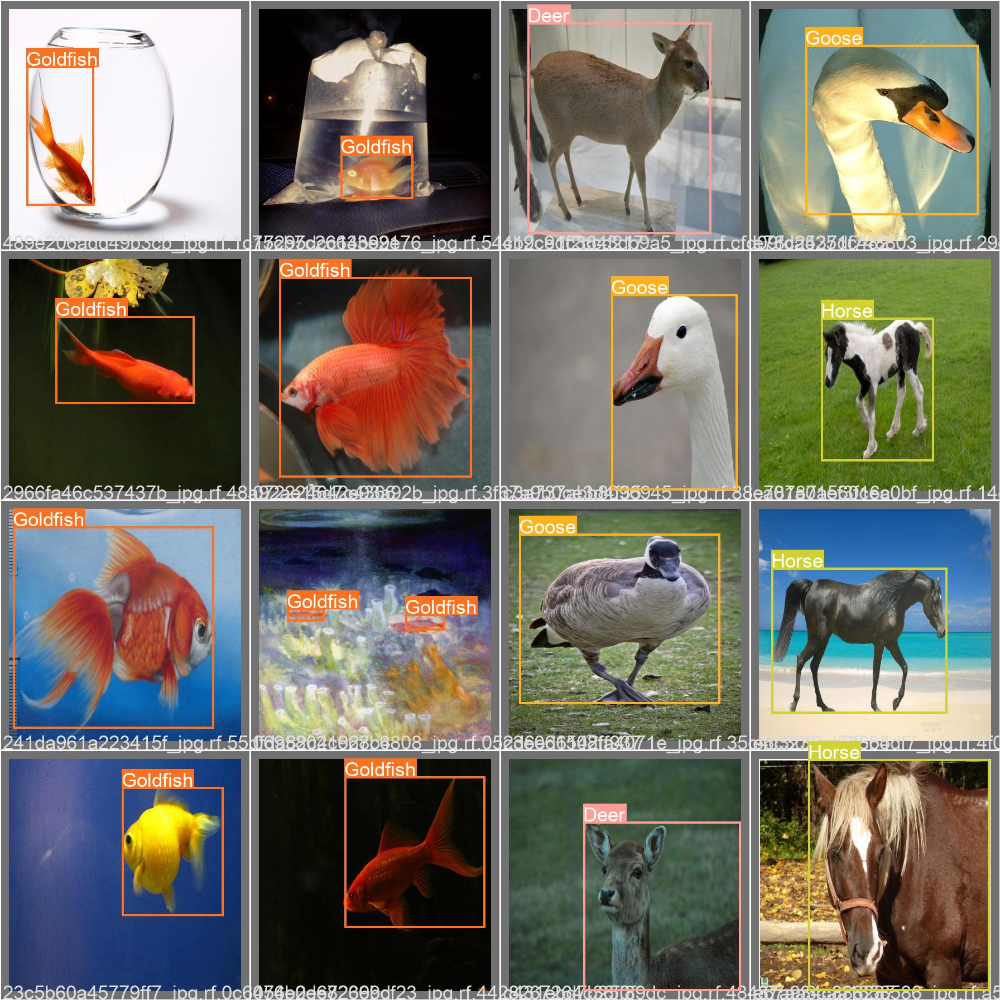

In [ ]:
Image(filename='/content/yolov5/runs/train/yolov5l_results/val_batch2_labels.jpg', width=900)

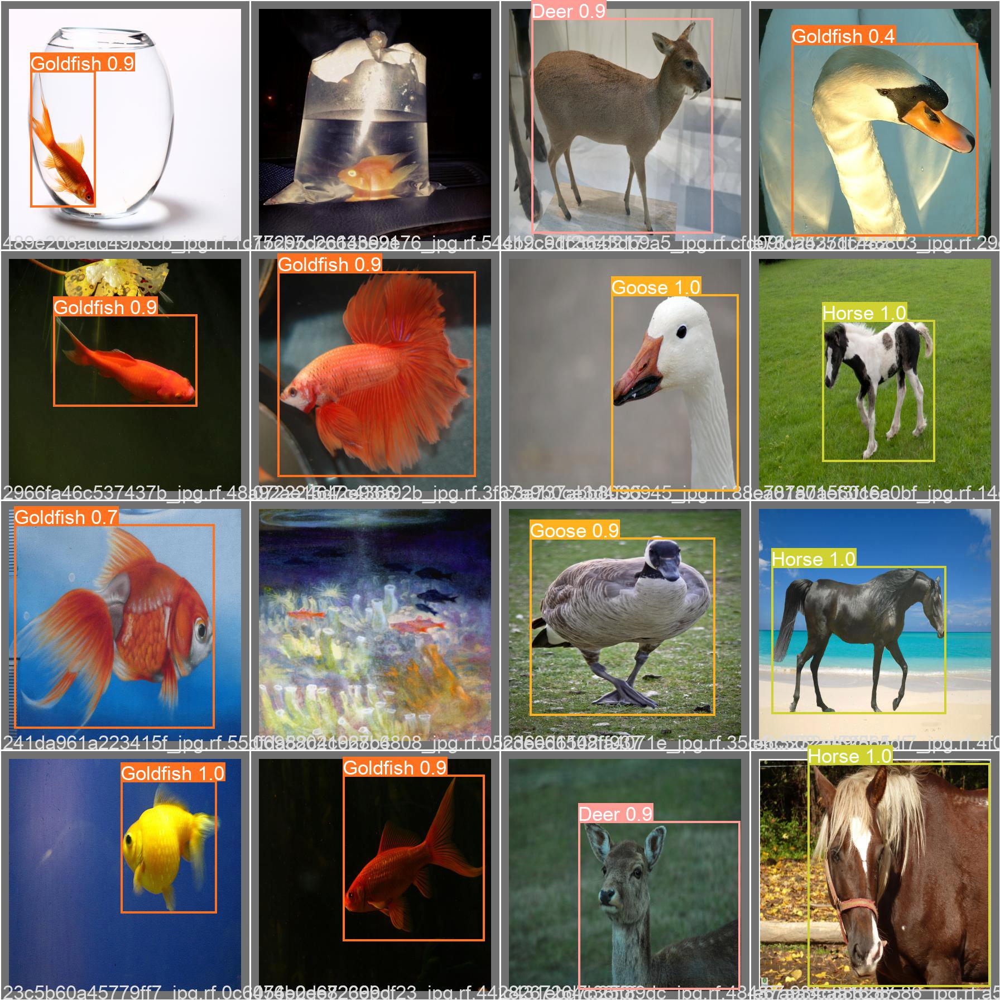

In [ ]:
Image(filename='/content/yolov5/runs/train/yolov5l_results/val_batch2_pred.jpg', width=900)

# Evaluating the Performance of our Detector 

In [ ]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 1076), started 0:00:34 ago. (Use '!kill 1076' to kill it.)

<IPython.core.display.Javascript object>

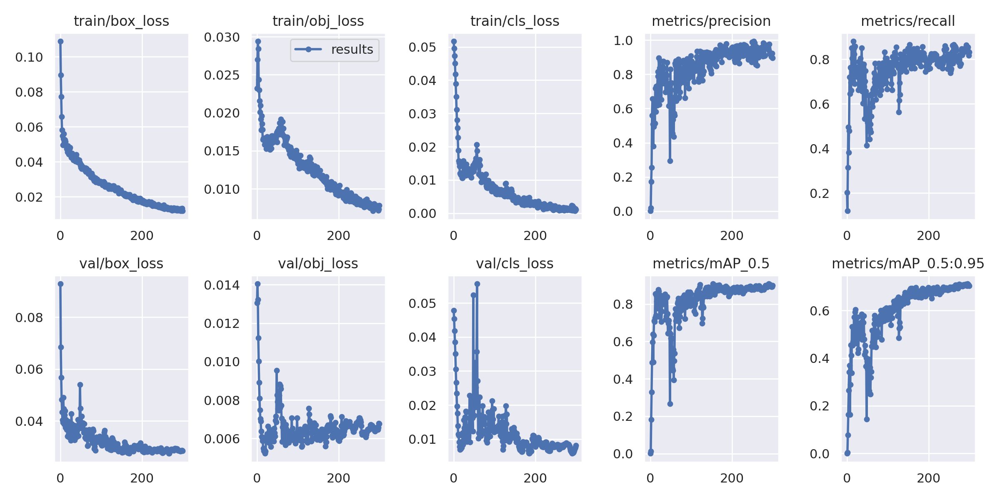

In [ ]:
# we can also output some older school graphs if the tensor board isn't working for whatever reason... 
from utils.plots import plot_results  # plot results.txt as results.png
Image(filename='/content/yolov5/runs/train/yolov5l_results/results.png', width=1000)  # view results.png

#Running Inference With Trained Weights


In [ ]:
# trained weights are saved by default in our weights folder
%ls runs/

train/


In [ ]:
%ls runs/train/yolov5l_results/weights

best.pt  last.pt


In [ ]:
# We use the trained weights on test images now
%cd /content/yolov5/
!python detect.py --weights runs/train/yolov5l_results/weights/best.pt --img 416 --conf 0.5 --source '/content/yolov5/Animal-dataset-1/test/images'

/content/yolov5
detect: weights=['runs/train/yolov5l_results/weights/best.pt'], source=/content/yolov5/Animal-dataset-1/test/images, imgsz=[416, 416], conf_thres=0.5, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.0-151-gabbdd48 torch 1.10.0+cu111 CUDA:0 (Tesla K80, 11441MiB)

Fusing layers... 
Model Summary: 367 layers, 46129818 parameters, 0 gradients, 107.9 GFLOPs
image 1/50 /content/yolov5/Animal-dataset-1/test/images/0588ea272f43edf2_jpg.rf.48c743c294020fdd7a96396c1f6c6bdb.jpg: 416x416 1 Butterfly, Done. (0.082s)
image 2/50 /content/yolov5/Animal-dataset-1/test/images/058d24f26b2124db_jpg.rf.23edb935cba4b6504b53caa9a9a19eb8.jpg: 416x416 Done. (0.074s)
image 3/50 /content/yolov5/Animal-dataset-1/test

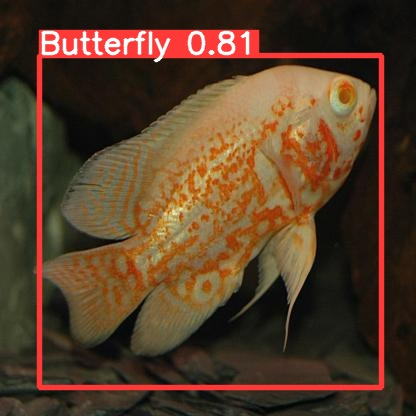

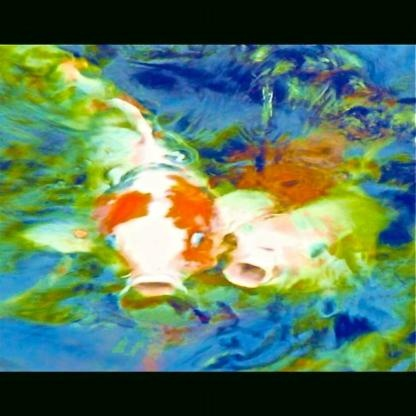

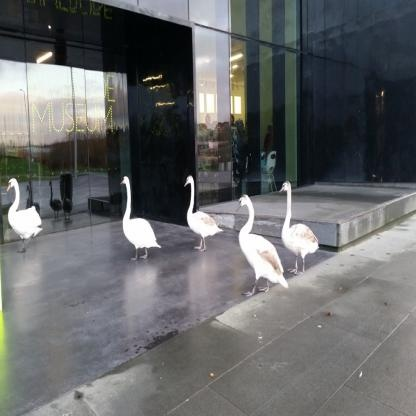

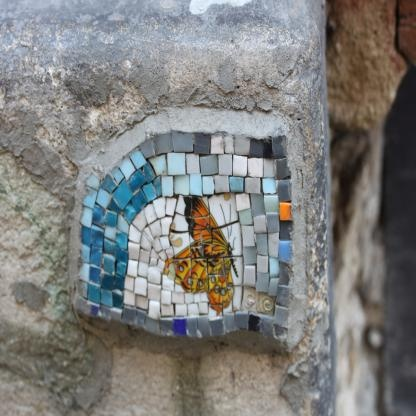

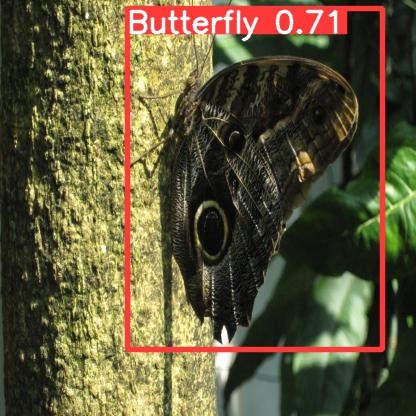

...

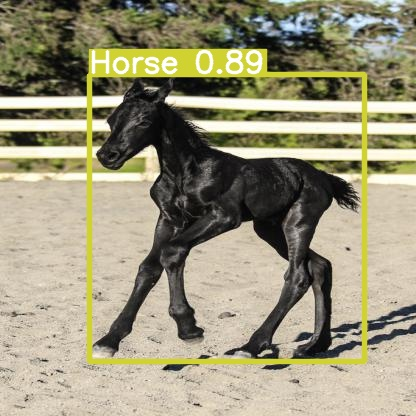

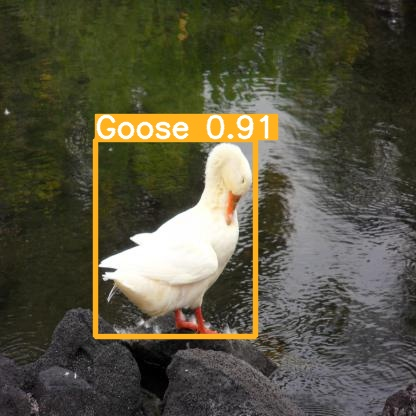

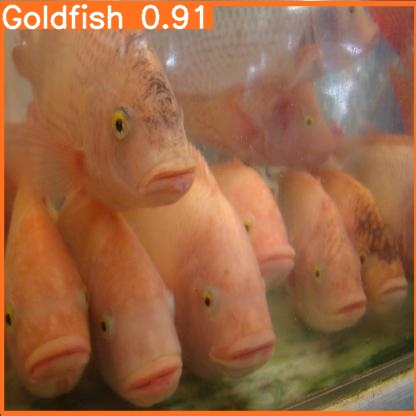

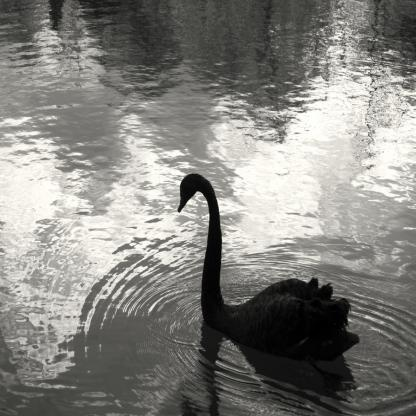

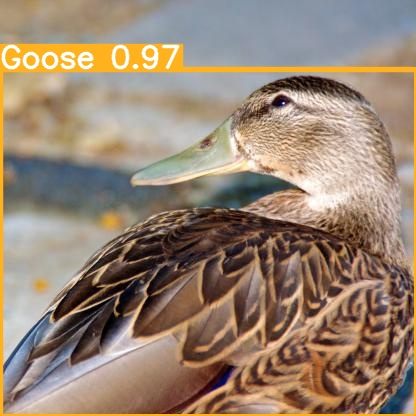

In [ ]:
# display inference on ALL test images

import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

# Export Trained Weights for Future Inference

Now that you have trained your custom detector, you can export the trained weights you have made here for inference on your device elsewhere

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
%cp /content/yolov5/runs/train/yolov5l_results/weights/best.pt /content/gdrive/My\ Drive

## Congrats!

Hope you enjoyed this!

--Team [Roboflow](https://roboflow.ai)